In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0060.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0044.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0081.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0075.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0050.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0032.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0013.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0040.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0036.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0001.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0069.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.football-helmet/076_0014.jpg
/kaggle/input/caltech256/256_ObjectCategories/076.fo

In [2]:
import tensorflow as tf
import PIL
from numpy.linalg import norm
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [3]:
res_model = ResNet50(weights='imagenet',
                         include_top=False,
                         input_shape=(224, 224, 3),
                        pooling='max')

2022-10-30 10:05:40.763332: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-30 10:05:40.878259: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-30 10:05:40.879092: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-10-30 10:05:40.880856: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

94781440/94765736 [==============================] - 1s 0us/step


In [4]:
res_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [5]:
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path,
                         target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [6]:
IMG_PATH='../input/caltech256/256_ObjectCategories/024.butterfly/024_0006.jpg'
features = extract_features(IMG_PATH, res_model)
print("Total length of features for one image: ", len(features))

2022-10-30 10:05:46.435264: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-10-30 10:05:48.082810: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Total length of features for one image:  2048


In [7]:
extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']

def get_file_list(root_dir):
    file_list = []
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                filepath = os.path.join(root, filename)
                if os.path.exists(filepath):
                  file_list.append(filepath)
                else:
                  print(filepath)
    return file_list

In [8]:
root_dir = '../input/caltech256/256_ObjectCategories/'
filenames = sorted(get_file_list(root_dir))
print(len(filenames))

30607


In [9]:
import math
import time

In [10]:
BATCH_SIZE = 128
generator = tf.keras.utils.image_dataset_from_directory(root_dir,
                                            shuffle=False,
                                           batch_size=BATCH_SIZE,
                                            image_size=(224,224))
num_images = len(generator.file_paths)
num_epochs = int(math.ceil(num_images / BATCH_SIZE))

start_time = time.time()
feature_list = []
feature_list = res_model.predict(generator, num_epochs)
end_time = time.time()

Found 30607 files belonging to 257 classes.


In [11]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(len(feature_list), -1)

print("Num images   = ", len(generator.file_paths))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in min = ", (end_time - start_time)/60)

Num images   =  30607
Shape of feature_list =  (30607, 2048)
Time taken in min =  1.6912628054618835


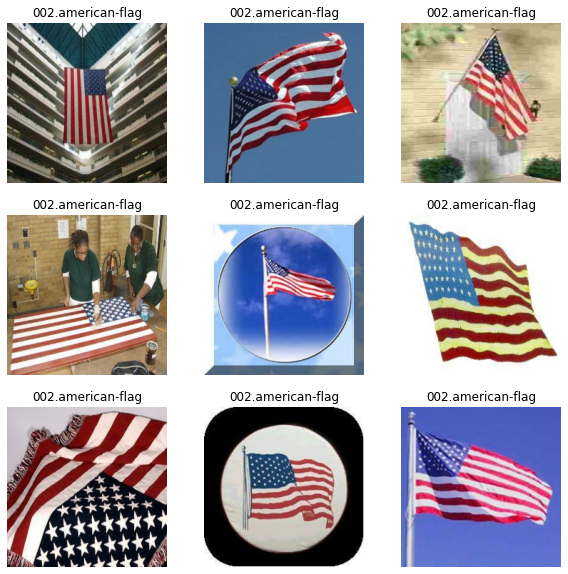

In [12]:
import matplotlib.pyplot as plt
class_names = generator.class_names
plt.figure(figsize=(10, 10))
for images, labels in generator.take(2):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [13]:
import pickle

In [14]:
pickle.dump(generator.class_names, open('./class_ids-caltech256.pickle',
                                    'wb'))
pickle.dump(generator.file_paths, open('./filenames-caltech256.pickle', 'wb'))
pickle.dump(
    feature_list,
    open('./features-caltech256-' + 'resnet50' + '.pickle', 'wb'))

In [15]:
filenames = pickle.load(open('./filenames-caltech256.pickle','rb'))
feature_list = pickle.load(open('./features-caltech256-resnet50.pickle',
                                'rb'))
class_ids = pickle.load(open('./class_ids-caltech256.pickle', 'rb'))

In [16]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  30607
Number of features per image =  2048


In [17]:
feature_list.shape

(30607, 2048)

In [18]:
len(class_ids)

257

Applying   Bruthforce KNN  on the saved features directly

In [19]:
import random

In [20]:
random_index = random.randint(0, num_images)

In [21]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute', metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors([feature_list[random_index]])

In [22]:
%timeit distances, indices = neighbors.kneighbors([feature_list[random_index]])

424 ms ± 137 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


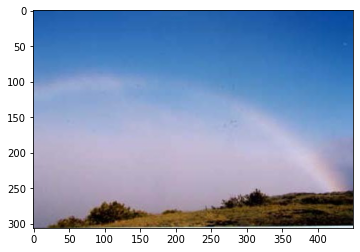

In [23]:
plt.imshow(mpimg.imread(filenames[random_index]))

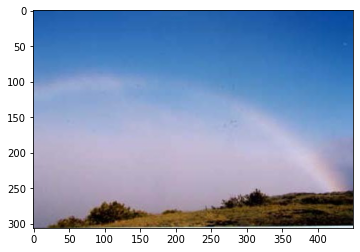

In [24]:
plt.imshow(mpimg.imread(filenames[indices[0][0]]))

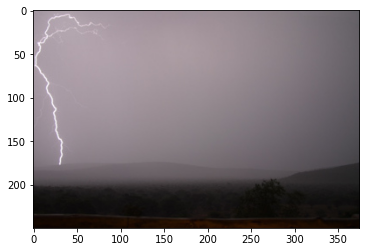

In [25]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]))

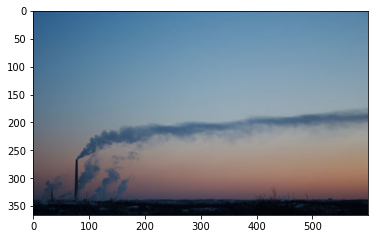

In [26]:
plt.imshow(mpimg.imread(filenames[indices[0][2]]))

In [27]:
for i in range(5):
    print(distances[0][i])

4.2146848e-08
0.72429687
0.7253174
0.72593075
0.73730916


In [28]:
def classname(str):
    return str.split('/')[-2]

def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]

In [29]:
def calculate_accuracy(feature_list):
    num_nearest_neighbors = 5
    correct_prediction = 0
    incorrect_prediction = 0
    neighbors = NearestNeighbors(n_neighbors=num_nearest_neighbors,
                                 algorithm='brute',
                                 metric='euclidean').fit(feature_list)
    start = time.time()
    for i in range(len(feature_list)):
        distances, indices = neighbors.kneighbors([feature_list[i]])
        for j in range(1, num_nearest_neighbors):
            if (classname(filenames[i]) == classname(
                    filenames[indices[0][j]])):
                correct_prediction += 1
            else:
                incorrect_prediction += 1
    end = time.time()
    accuracy = round(
        100.0 * correct_prediction /
        (1.0 * correct_prediction + incorrect_prediction), 2), end - start
    return accuracy

In [30]:
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) // columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
      

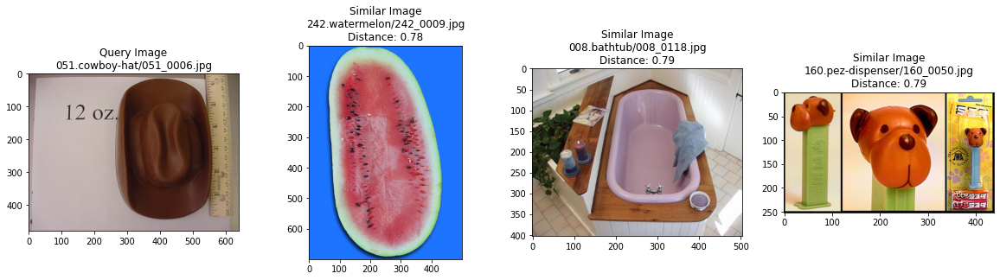

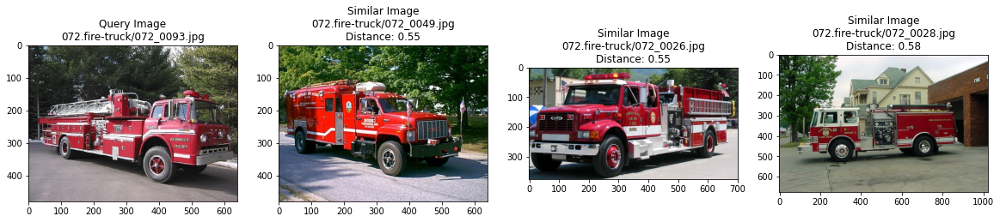

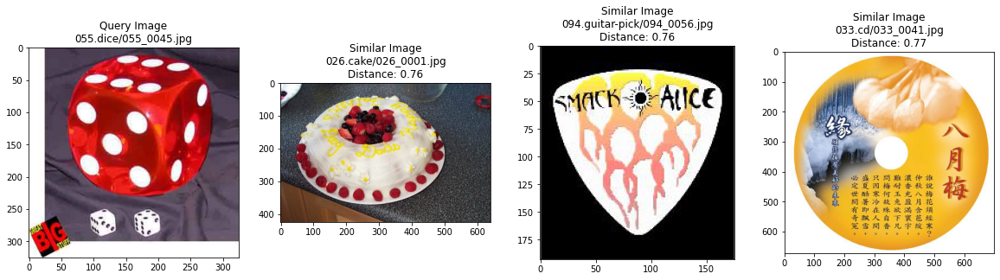

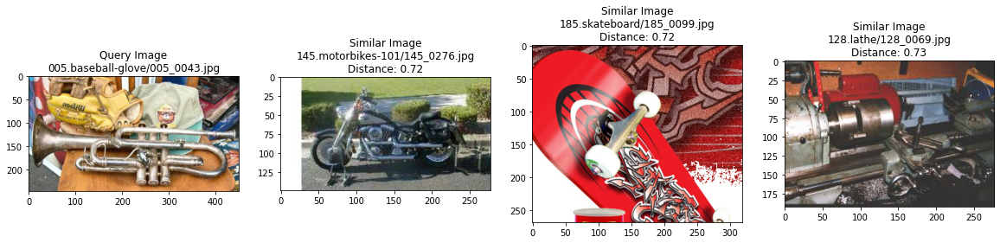

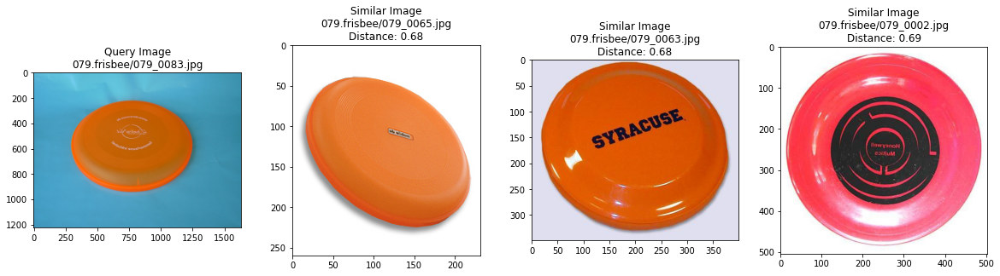

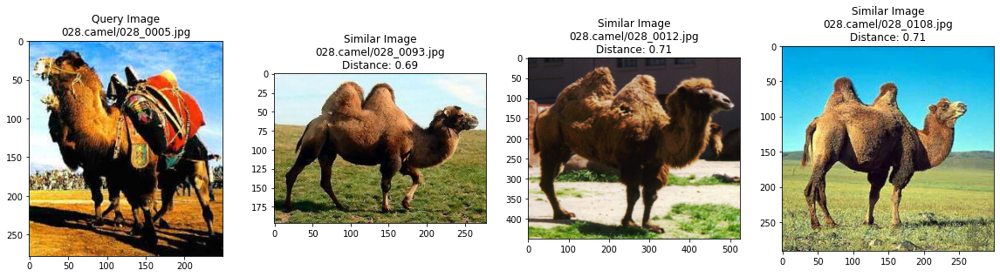

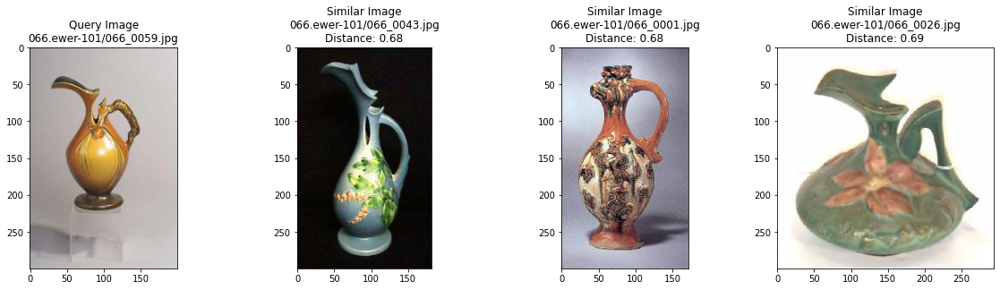

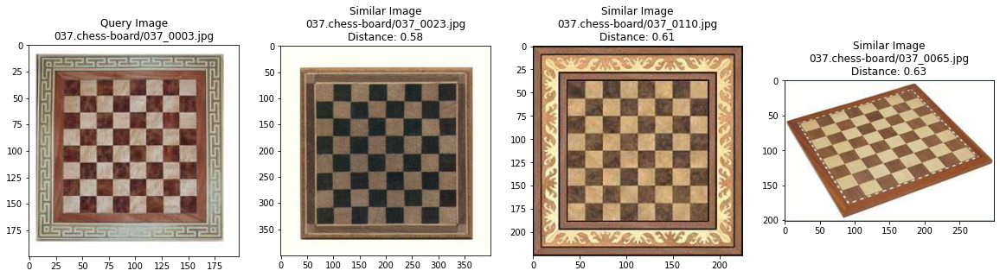

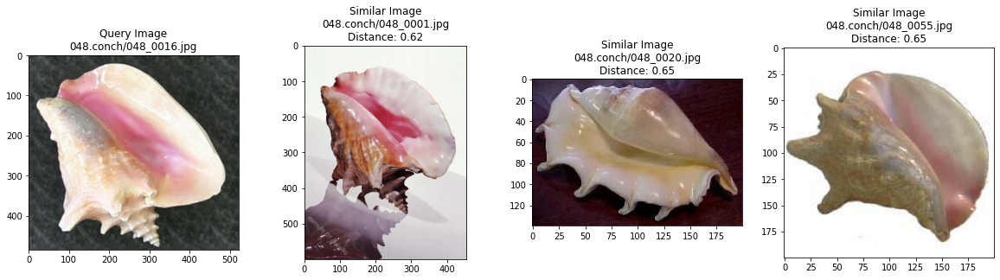

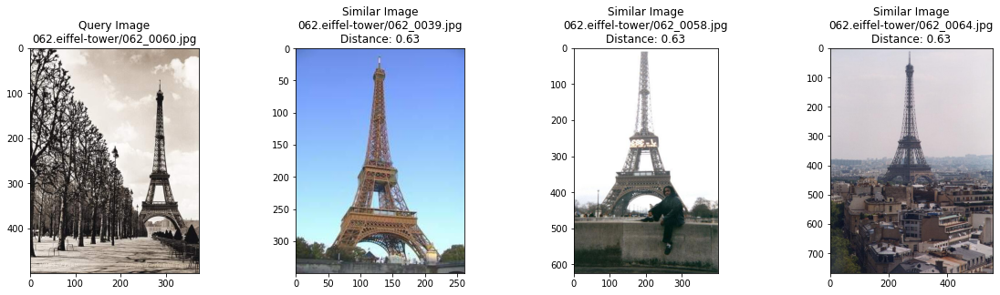

In [31]:
for i in range(10):
    random_image_index = random.randint(0, 10000)
    distances, indices = neighbors.kneighbors(
        [feature_list[random_image_index]])
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [32]:
# print("Accuracy on original feature set : ",
#       calculate_accuracy(feature_list[:]))

In [33]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

Now Let's implement dimensionality reduction on the features extracted using PCA and TSNE

In [34]:
num_feature_dimensions=200
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

Apply KNN after dimensionality reduction

In [35]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute', metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[random_index]])
%timeit distances, indices = neighbors.kneighbors([feature_list_compressed[random_index]])

28.2 ms ± 285 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [36]:
neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute', metric='cosine').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[random_index]])
%timeit distances, indices = neighbors.kneighbors([feature_list_compressed[random_index]])

40.8 ms ± 5.96 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.003s...
[t-SNE] Computed neighbors for 10000 samples in 2.505s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.173629
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.770721
[t-SNE] KL divergence after 1000 iterations: 1.899427


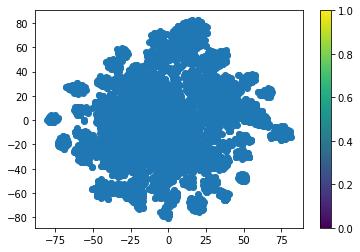

In [37]:
selected_features = feature_list_compressed[:10000]
selected_class_ids = class_ids[:10000]
selected_filenames = filenames[:10000]
tsne_results = TSNE(n_components=2,verbose=1,metric='euclidean').fit_transform(selected_features)
# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1],cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

In [38]:
pca_dimensions = [1, 2, 3, 4, 5, 10, 20, 50, 75, 100, 150, 200]
pca_accuracy = []
pca_time = []

for dimensions in pca_dimensions:
    pca = PCA(n_components=dimensions)
    pca.fit(feature_list)
    feature_list_compressed = pca.transform(feature_list[:])
    # Calculate accuracy over the compressed features
    accuracy, t = calculate_accuracy(feature_list_compressed[:])
    pca_time.append(t)
    pca_accuracy.append(accuracy)
    print("For PCA Dimensions = ", dimensions, ",\tAccuracy = ", accuracy, "%",
          ",\tTime = ", pca_time[-1])

For PCA Dimensions =  1 ,	Accuracy =  1.41 % ,	Time =  49.68992638587952
For PCA Dimensions =  2 ,	Accuracy =  3.16 % ,	Time =  55.45817828178406
For PCA Dimensions =  3 ,	Accuracy =  8.24 % ,	Time =  57.56967306137085
For PCA Dimensions =  4 ,	Accuracy =  13.16 % ,	Time =  59.21145248413086
For PCA Dimensions =  5 ,	Accuracy =  17.03 % ,	Time =  63.13542652130127
For PCA Dimensions =  10 ,	Accuracy =  32.51 % ,	Time =  151.9781095981598
For PCA Dimensions =  20 ,	Accuracy =  47.37 % ,	Time =  192.56565809249878
For PCA Dimensions =  50 ,	Accuracy =  59.94 % ,	Time =  300.6232726573944
For PCA Dimensions =  75 ,	Accuracy =  62.97 % ,	Time =  408.81081104278564
For PCA Dimensions =  100 ,	Accuracy =  64.24 % ,	Time =  503.04955649375916
For PCA Dimensions =  150 ,	Accuracy =  65.51 % ,	Time =  720.5076599121094
For PCA Dimensions =  200 ,	Accuracy =  66.1 % ,	Time =  898.0176892280579


# Let Us Compare this with SOTA similarity search algorithms

In [39]:
!pip3 install Annoy

In [40]:
from annoy import AnnoyIndex

In [41]:
t = AnnoyIndex(200)  # Length of item vector that will be indexed
starttime = time.time()
for i in range(num_images):
    feature = feature_list_compressed[i]
    t.add_item(i, feature)
endtime = time.time()
print(endtime - starttime)
t.build(40) 
t.save('./caltech256index.ann')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  """Entry point for launching an IPython kernel.


0.4788990020751953


True

In [42]:
random_image_index = 2501

In [43]:
u = AnnoyIndex(200)
%timeit u.get_nns_by_vector(feature_list_compressed[random_image_index], 5, include_distances=True)
indexes = u.get_nns_by_vector(feature_list_compressed[random_image_index],
                              5,
                              include_distances=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  """Entry point for launching an IPython kernel.


18 µs ± 2.55 µs per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [44]:
def calculate_annoy_time():
    for i in range(0, 100):
        indexes = u.get_nns_by_vector(feature_list_compressed[random_image_index],
                                      5,
                                      include_distances=True)

In [45]:
%time calculate_annoy_time()

CPU times: user 4.6 ms, sys: 215 µs, total: 4.81 ms
Wall time: 4.3 ms
